<a href="https://colab.research.google.com/github/Vinod826S/Vision-Algorithm-for-generation-of-XRD-patterns/blob/main/BTP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **IMAGE 1**

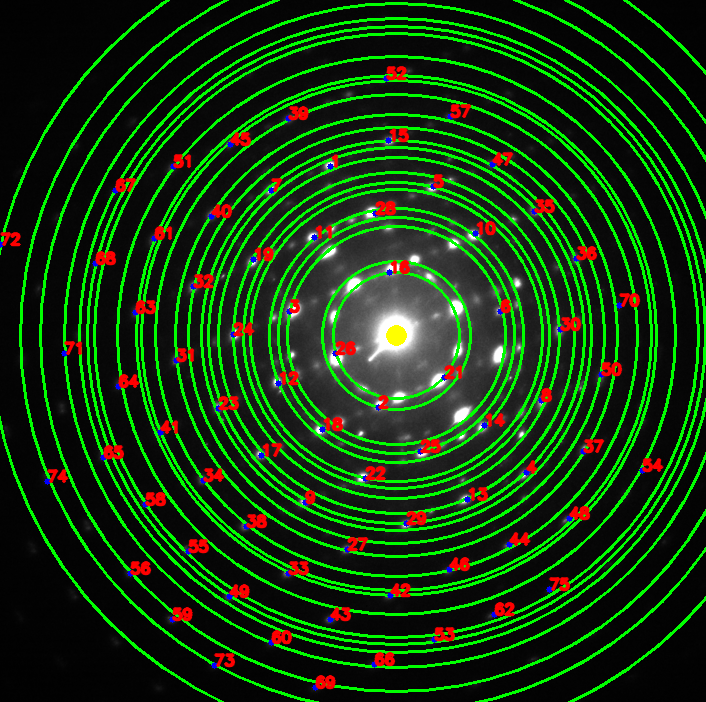

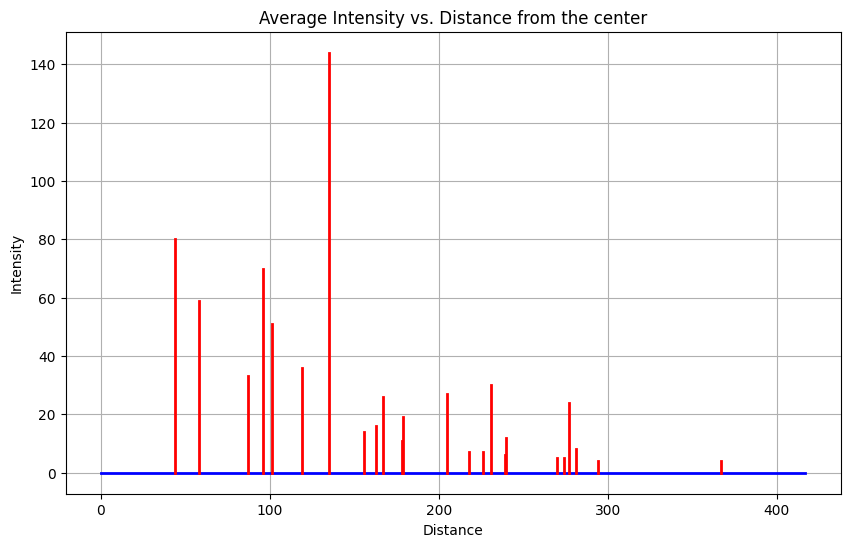

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import csv
from google.colab.patches import cv2_imshow
import pandas as pd

def distance(point1, point2):
    return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

# Load the image
image = cv2.imread('/content/BTP_Img_3.png', cv2.IMREAD_GRAYSCALE)
bgr_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

# Find the coordinates and intensities of all points
coordinates = np.column_stack(np.where(image > 0))
intensities = [image[x, y] for x, y in coordinates]

# Sort coordinates based on intensity
sorted_indices = np.argsort(intensities)[::-1]
sorted_coordinates = [coordinates[i] for i in sorted_indices]

# Take the top 20 points with minimum distance of 50 units
top_coordinates = []
for coord in sorted_coordinates:
    if all(distance(coord, existing_coord) >= 60 for existing_coord in top_coordinates):
        top_coordinates.append(coord)
    if len(top_coordinates) == 75:
        break

points = [(335, 353), (389, 272), (444, 377)]

# Find the center and radius of the circle passing through the points

def find_circle_center_radius(p1, p2, p3):
    x1, y1 = p1
    x2, y2 = p2
    x3, y3 = p3
    ma = (y2 - y1) / (x2 - x1)
    mb = (y3 - y2) / (x3 - x2)
    xc = (ma * mb * (y1 - y3) + mb * (x1 + x2) - ma * (x2 + x3)) / (2 * (mb - ma))
    yc = -1 / ma * (xc - (x1 + x2) / 2) + (y1 + y2) / 2
    radius = np.sqrt((x1 - xc) ** 2 + (y1 - yc) ** 2)
    return (int(xc), int(yc)), int(radius)

# Find the center and radius of the circle passing through the points
center, radius = find_circle_center_radius(points[0], points[1], points[2])

# # # Draw the center on the image
cv2.circle(bgr_image, center, 5, (0, 255, 255), 10)  # Draw a filled blue circle at the center with a radius of 10 pixels

point_list = [15, 1, 2, 24, 11, 21, 23, 4, 3, 12, 30, 31, 35, 60, 33, 40, 50, 64, 57, 48, 70, 55, 71, 72]

average_intensities = []

for i in point_list:
    point = tuple(reversed(top_coordinates[i]))
    rad = int(distance(center, point))
    cv2.circle(bgr_image, center, rad, (0,255,0), 2)

    intensities_on_circle = []

    for theta in np.linspace(0, 2*np.pi, 100):
        x_on_circle = int(center[0] + rad * np.cos(theta))
        y_on_circle = int(center[1] + rad * np.sin(theta))
        if 0 <= y_on_circle < image.shape[0] and 0 <= x_on_circle < image.shape[1]:
            intensity = image[y_on_circle, x_on_circle]
            intensities_on_circle.append(intensity)

    # Calculate average intensity for the circle
    average_intensity_circle = np.round(np.mean(intensities_on_circle))
    average_intensities.append(average_intensity_circle)

for i, (x, y) in enumerate(top_coordinates):
    if i != 19:
        cv2.circle(bgr_image, (y, x), 3, (255, 0, 0), -1)  # Small blue dot
        cv2.putText(bgr_image, str(i+1), (y, x), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2, cv2.LINE_AA)

cv2_imshow(bgr_image)

with open('Img3.csv', 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Point Number', 'X Coordinate', 'Y Coordinate', 'Intensity', 'Distance', 'Average Intensity'])
    for i, (x, y) in enumerate(top_coordinates):
        if i in point_list:  # Check if the point number is in point_list
            intensity = image[x, y]
            distance_from_center = int(distance(center, (x, y)))
            index = point_list.index(i)
            average_intensity = average_intensities[index] if index < len(average_intensities) else 0
            csvwriter.writerow([i + 1, y, x, intensity, distance_from_center, average_intensity])

data = {}

df = pd.read_csv('/content/Img3.csv')
distance = df['Distance']
avg_intensity = df['Average Intensity']

for d, a in zip(distance, avg_intensity):
    data[d] = a

sorted_data = sorted(data.items(), reverse = True)

# Extract distances and intensities
distances = [d[0] for d in sorted_data]
intensities = [d[1] for d in sorted_data]
distances2 = sorted(distances, reverse = True)

plt.figure(figsize=(10, 6))

plt.plot([0, distances2[0] + 50], [0, 0], color='blue', linestyle='-', linewidth=2)

for distance, intensity in data.items():
    plt.plot([distance, distance], [0, intensity], color='red', linestyle='-', linewidth=2);

plt.xlabel('Distance')
plt.ylabel('Intensity')
plt.title('Average Intensity vs. Distance from the center')
plt.grid(True)
plt.show()

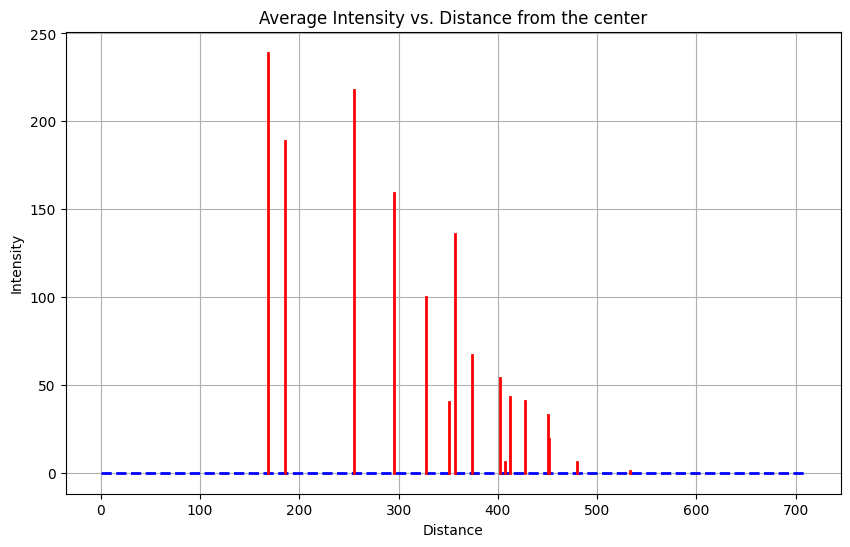

In [ ]:
import matplotlib.pyplot as plt

# Provided data
data = {
    660: 0,
    593: 0,
    533: 1,
    530: 0,
    480: 6,
    452: 19,
    451: 33,
    427: 41,
    412: 43,
    407: 6,
    402: 54,
    374: 67,
    357: 136,
    351: 40,
    328: 100,
    295: 159,
    255: 218,
    186: 189,
    168: 239
}

# Sort data by distance
sorted_data = sorted(data.items())

# Extract distances and intensities
distances = [d[0] for d in sorted_data]
intensities = [d[1] for d in sorted_data]
distances2 = sorted(distances)

# Plot the graph
plt.figure(figsize=(10, 6))

# Draw the line for default intensity value (0)
plt.plot([0, distances2[-1] + 50], [0, 0], color='blue', linestyle='--', linewidth=2)

# Add spikes for intensity values
for distance, intensity in data.items():
    plt.plot([distance, distance], [0, intensity], color='red', linestyle='-', linewidth=2)

# Set labels and title
plt.xlabel('Distance')
plt.ylabel('Intensity')
plt.title('Average Intensity vs. Distance from the center')
plt.grid(True)
plt.show()

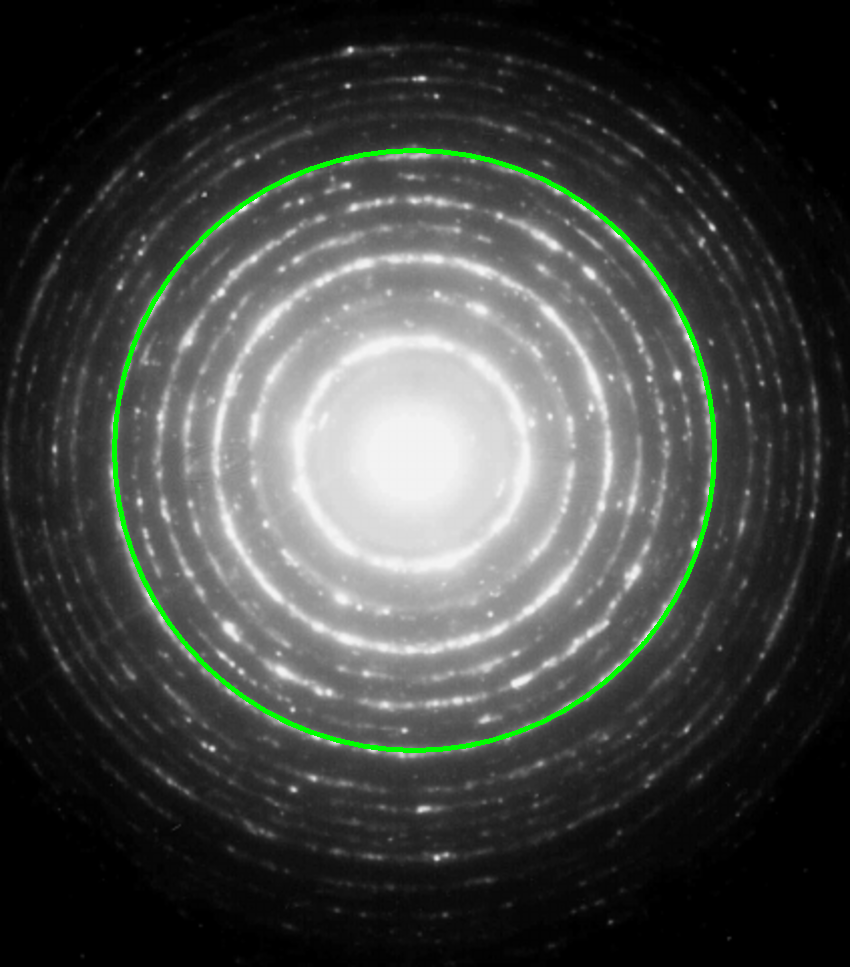

Number of circles in the image: 1


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def count_circles(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp = 1,
        minDist = 100,
    )

    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")

        for (x, y, r) in circles:
            cv2.circle(img, (x, y), r, (0, 255, 0), 4)

        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        return len(circles)

    else:
        print("No circles found.")
        return 0

image_path = "/content/BTP_Img_1.png"
num_circles = count_circles(image_path)
print(f"Number of circles in the image: {num_circles}")

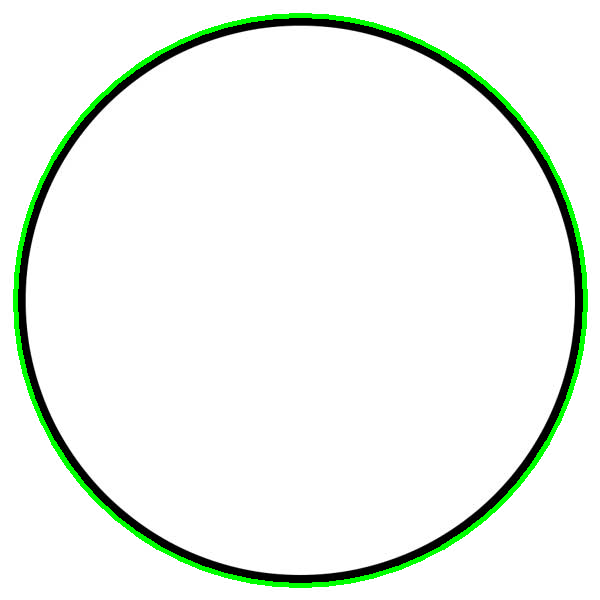

Number of circles in the image: 1


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def count_circles(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp = 1,
        minDist = 50
    )

    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")

        for (x, y, r) in circles:
            cv2.circle(img, (x, y), r, (0, 255, 0), 4)

        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        return len(circles)
    else:
        print("No circles found.")
        return 0

image_path = "/content/BTP_Img_7.jpg"
num_circles = count_circles(image_path)
print(f"Number of circles in the image: {num_circles}")

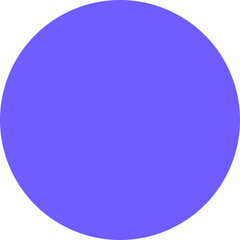

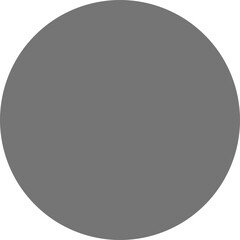

No circles found.
Number of circles in the image: 0


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def count_circles(image_path):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    cv2_imshow(img)
    print("\n\n")
    cv2_imshow(gray)

    # Apply GaussianBlur to reduce noise and help circle detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use HoughCircles to detect circles in the image
    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp = 1,
        minDist = 50
    )

    if circles is not None:
        # Convert the (x, y) coordinates and radius of the circles to integers
        circles = np.round(circles[0, :]).astype("int")

        # Draw the circles on the original image
        for (x, y, r) in circles:
            cv2.circle(img, (x, y), r, (0, 255, 0), 4)

        # Display the resulting image with circles
        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        # Return the number of circles detected
        return len(circles)
    else:
        print("No circles found.")
        return 0

# Example usage:
image_path = "/content/BTP_Img_8.jpg"
num_circles = count_circles(image_path)
print(f"Number of circles in the image: {num_circles}")

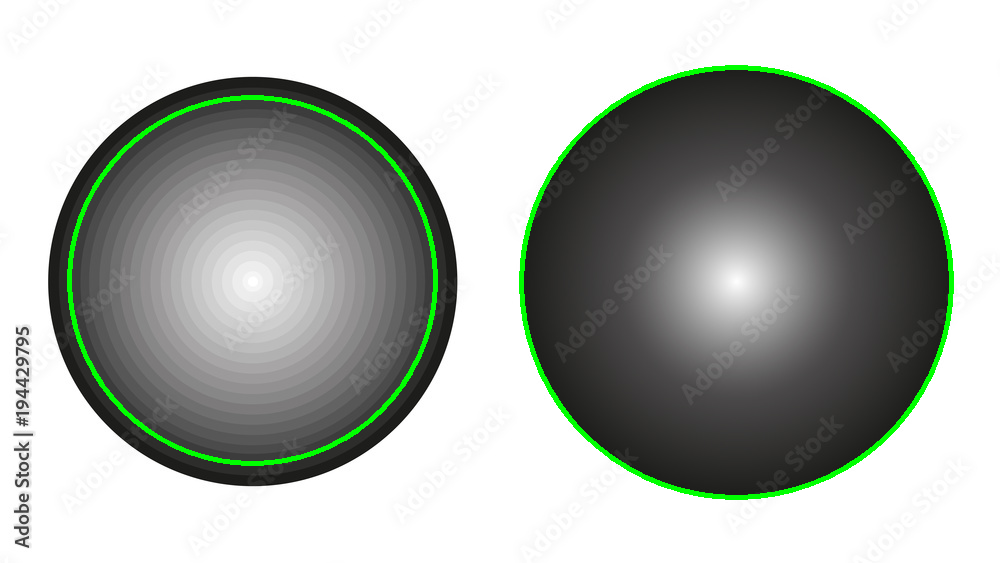

Number of circles in the image: 2


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def count_circles(image_path):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply GaussianBlur to reduce noise and help circle detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use HoughCircles to detect circles in the image
    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp = 1,
        minDist = 50
    )

    if circles is not None:
        # Convert the (x, y) coordinates and radius of the circles to integers
        circles = np.round(circles[0, :]).astype("int")

        # Draw the circles on the original image
        for (x, y, r) in circles:
            cv2.circle(img, (x, y), r, (0, 255, 0), 4)

        # Display the resulting image with circles
        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        # Return the number of circles detected
        return len(circles)
    else:
        print("No circles found.")
        return 0

# Example usage:
image_path = "/content/BTP_Img_2.jpg"
num_circles = count_circles(image_path)
print(f"Number of circles in the image: {num_circles}")

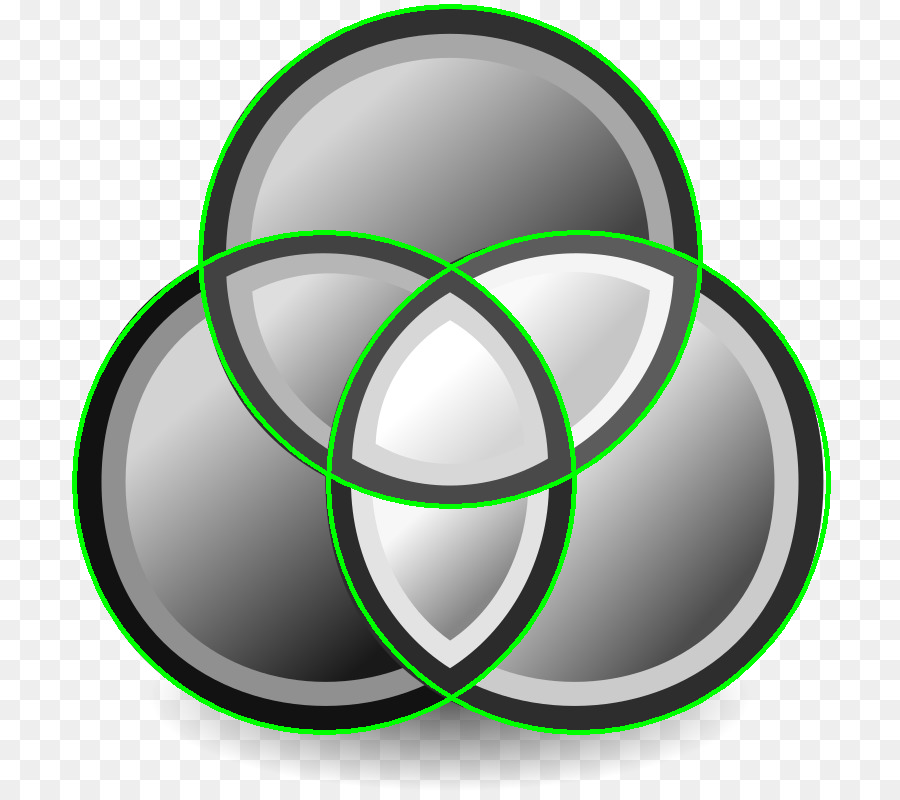

Number of circles in the image: 3


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def count_circles(image_path):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply GaussianBlur to reduce noise and help circle detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use HoughCircles to detect circles in the image
    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp = 1,
        minDist = 70
    )

    if circles is not None:
        # Convert the (x, y) coordinates and radius of the circles to integers
        circles = np.round(circles[0, :]).astype("int")

        # Draw the circles on the original image
        for (x, y, r) in circles:
            cv2.circle(img, (x, y), r, (0, 255, 0), 4)

        # Display the resulting image with circles
        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        # Return the number of circles detected
        return len(circles)
    else:
        print("No circles found.")
        return 0

# Example usage:
image_path = "/content/BTP_Img_6.jpg"
num_circles = count_circles(image_path)
print(f"Number of circles in the image: {num_circles}")

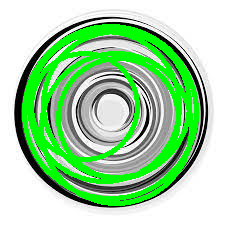

Number of circles in the image: 6


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def count_circles(image_path):
    # Read the image
    img = cv2.imread(image_path, cv2.IMREAD_COLOR)

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply GaussianBlur to reduce noise and help circle detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use HoughCircles to detect circles in the image
    circles = cv2.HoughCircles(
        gray,
        cv2.HOUGH_GRADIENT,
        dp = 1,
        minDist = 6
    )

    if circles is not None:
        # Convert the (x, y) coordinates and radius of the circles to integers
        circles = np.round(circles[0, :]).astype("int")

        # Draw the circles on the original image
        for (x, y, r) in circles:
            cv2.circle(img, (x, y), r, (0, 255, 0), 4)

        # Display the resulting image with circles
        cv2_imshow(img)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        # Return the number of circles detected
        return len(circles)
    else:
        print("No circles found.")
        return 0

# Example usage:
image_path = "/content/BTP_Img_5.png"
num_circles = count_circles(image_path)
print(f"Number of circles in the image: {num_circles}")

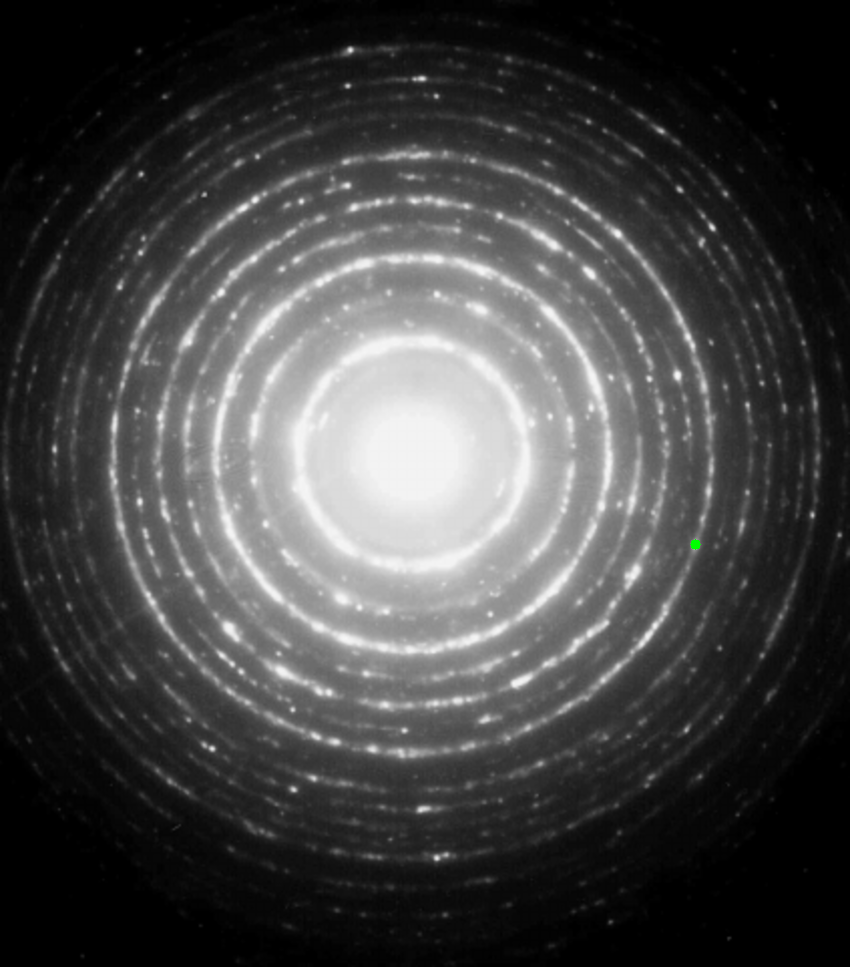

In [ ]:
from google.colab.patches import cv2_imshow
import numpy as np

# Load the image
image = cv2.imread('/content/BTP_Img_1.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find the maximum intensity point
max_intensity = np.max(gray_image)
max_intensity_coords = np.argwhere(gray_image == max_intensity)[0]

# Draw a marker at the maximum intensity point
marked_image = cv2.circle(image, tuple(max_intensity_coords[::-1]), 5, (0, 255, 0), -1)

# Display the marked image
cv2_imshow(marked_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

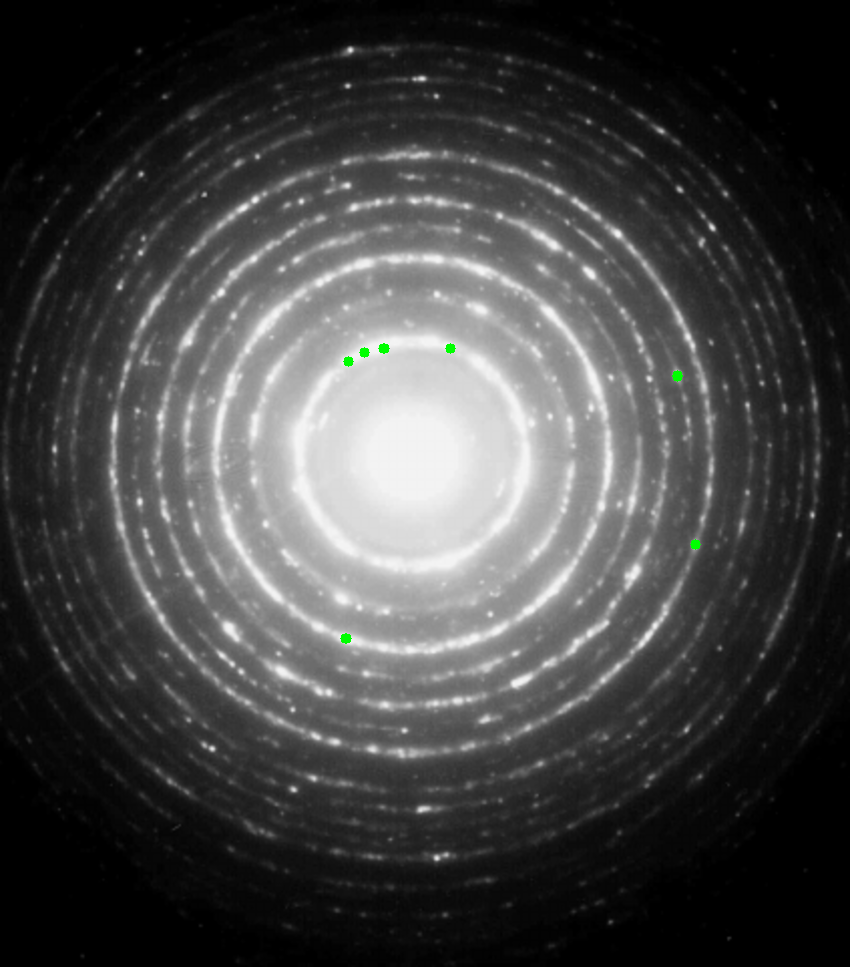

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Load the image
image = cv2.imread('/content/BTP_Img_1.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find the coordinates of the top 10 points with the highest intensity
top_coords = []
for _ in range(10):
    max_intensity = 0
    max_intensity_coords = (0, 0)
    for y in range(gray_image.shape[0]):
        for x in range(gray_image.shape[1]):
            intensity = gray_image[y, x]
            if intensity > max_intensity and (x, y) not in top_coords:
                max_intensity = intensity
                max_intensity_coords = (x, y)
    top_coords.append(max_intensity_coords)

# Draw markers at the top 10 points
marked_image = image.copy()  # Make a copy to avoid modifying the original image
for coord in top_coords:
    marked_image = cv2.circle(marked_image, coord, 5, (0, 255, 0), -1)

# Display the marked image
cv2_imshow(marked_image)

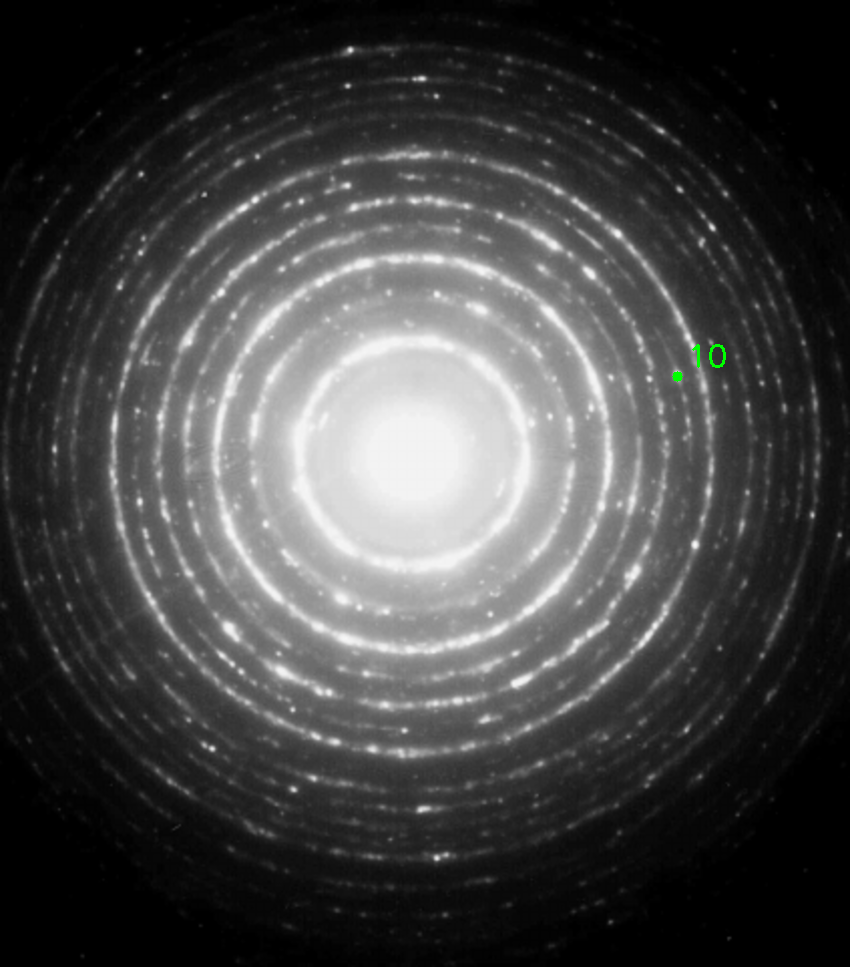

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import csv

# Load the image
image = cv2.imread('/content/BTP_Img_1.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find the coordinates of the top 10 points with the highest intensity
top_coords = []
for i in range(1, 11):
    max_intensity = 0
    max_intensity_coords = (0, 0)
    for y in range(gray_image.shape[0]):
        for x in range(gray_image.shape[1]):
            intensity = gray_image[y, x]
            if intensity > max_intensity and (x, y) not in top_coords:
                max_intensity = intensity
                max_intensity_coords = (x, y)
    top_coords.append(max_intensity_coords)
    # Draw markers
    marked_image = cv2.circle(image.copy(), max_intensity_coords, 5, (0, 255, 0), -1)
    # Add labels near the markers
    marked_image = cv2.putText(marked_image, f'{i}', (max_intensity_coords[0] + 10, max_intensity_coords[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

# Save coordinates and labels to a CSV file
with open('top_coordinates.csv', 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Label', 'X', 'Y'])
    for i, (x, y) in enumerate(top_coords, start=1):
        csvwriter.writerow([f'Top {i}', x, y])

# Display the marked image
cv2_imshow(marked_image)

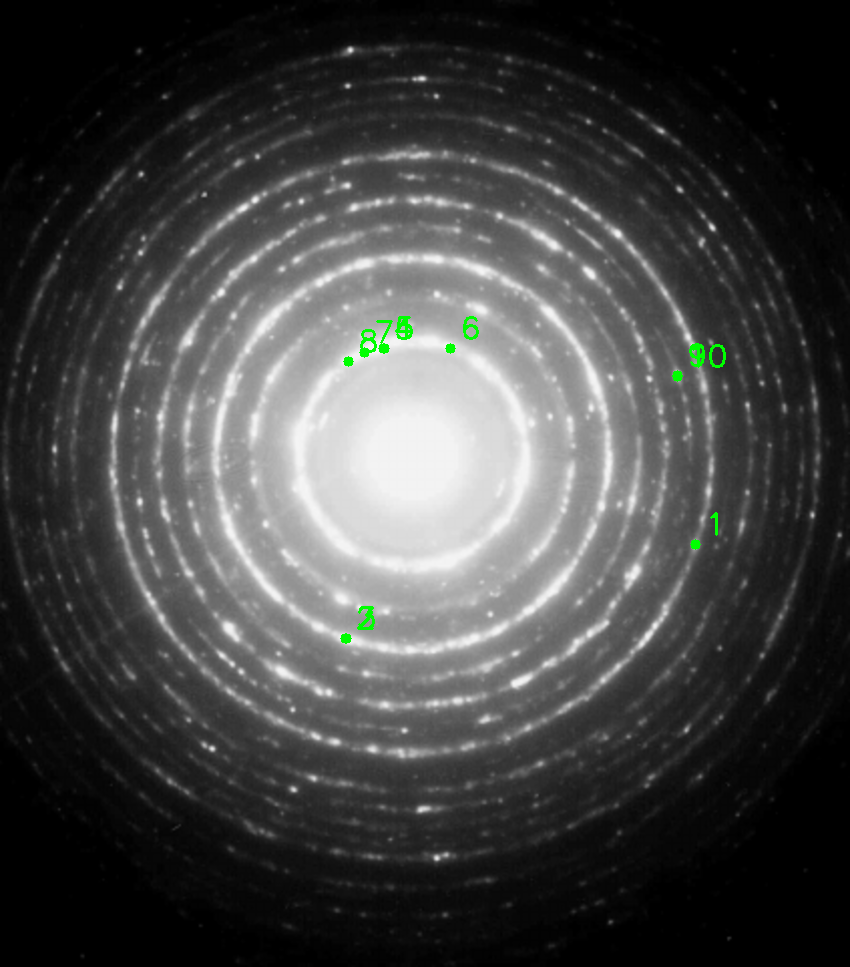

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import csv

# Load the image
image = cv2.imread('/content/BTP_Img_1.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find the coordinates of the top 10 points with the highest intensity
top_coords = []
for i in range(10):
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(gray_image)
    top_coords.append(max_loc)
    # Mark the point with a circle and label it
    cv2.circle(image, max_loc, 5, (0, 255, 0), -1)
    cv2.putText(image, f'{i+1}', (max_loc[0] + 10, max_loc[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    # Set the intensity of the found maximum to zero
    gray_image[max_loc[1], max_loc[0]] = 0

# Save coordinates, labels, and intensity values to a CSV file
with open('top_coordinates.csv', 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Label', 'X', 'Y', 'Intensity'])
    for i, (x, y) in enumerate(top_coords, start=1):
        intensity = image[y, x][0]  # Intensity at the point's location
        csvwriter.writerow([f'Top {i}', x, y, intensity])

# Display the marked image
cv2_imshow(image)

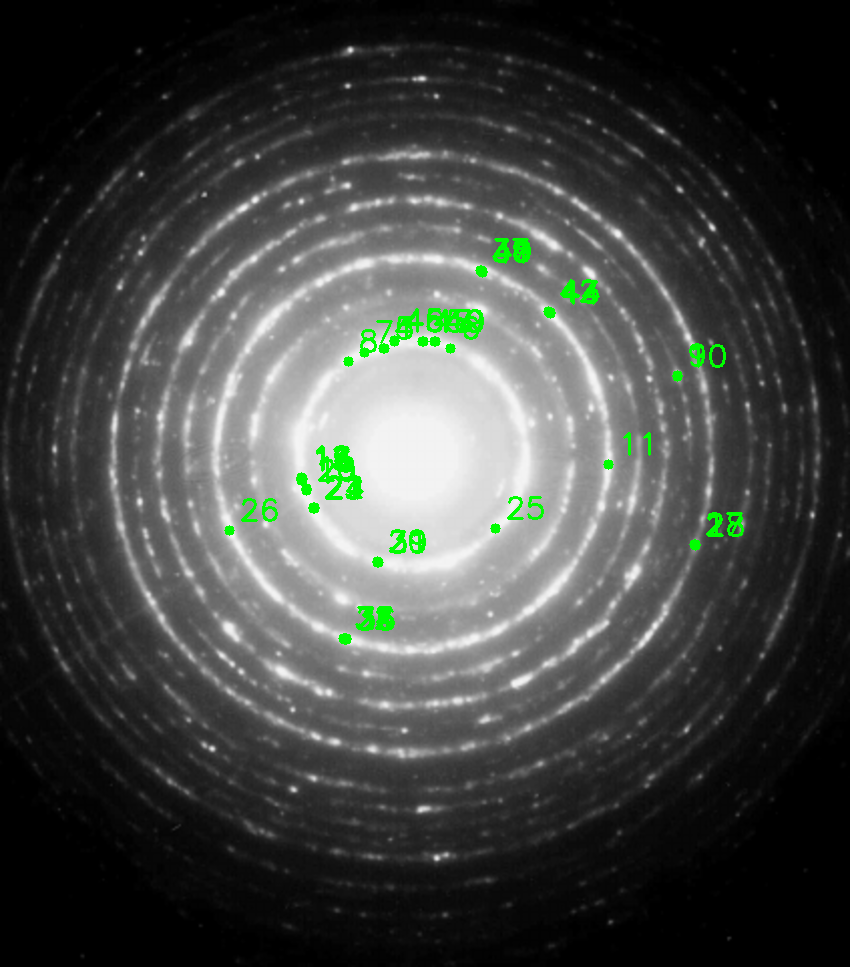

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import csv

# Load the image
image = cv2.imread('/content/BTP_Img_1.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find the coordinates of the top 10 points with the highest intensity
top_coords = []
for i in range(50):
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(gray_image)
    top_coords.append(max_loc)
    # Mark the point with a circle and label it
    cv2.circle(image, max_loc, 5, (0, 255, 0), -1)
    cv2.putText(image, f'{i+1}', (max_loc[0] + 10, max_loc[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    # Set the intensity of the found maximum to zero
    gray_image[max_loc[1], max_loc[0]] = 0

# Save coordinates, labels, and intensity values to a CSV file
with open('top_coordinates_50.csv', 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Label', 'X', 'Y', 'Intensity'])
    for i, (x, y) in enumerate(top_coords, start=1):
        intensity = gray_image[y, x]  # Intensity from the grayscale image
        csvwriter.writerow([f'Top {i}', x, y, intensity])

# Display the marked image
cv2_imshow(image)

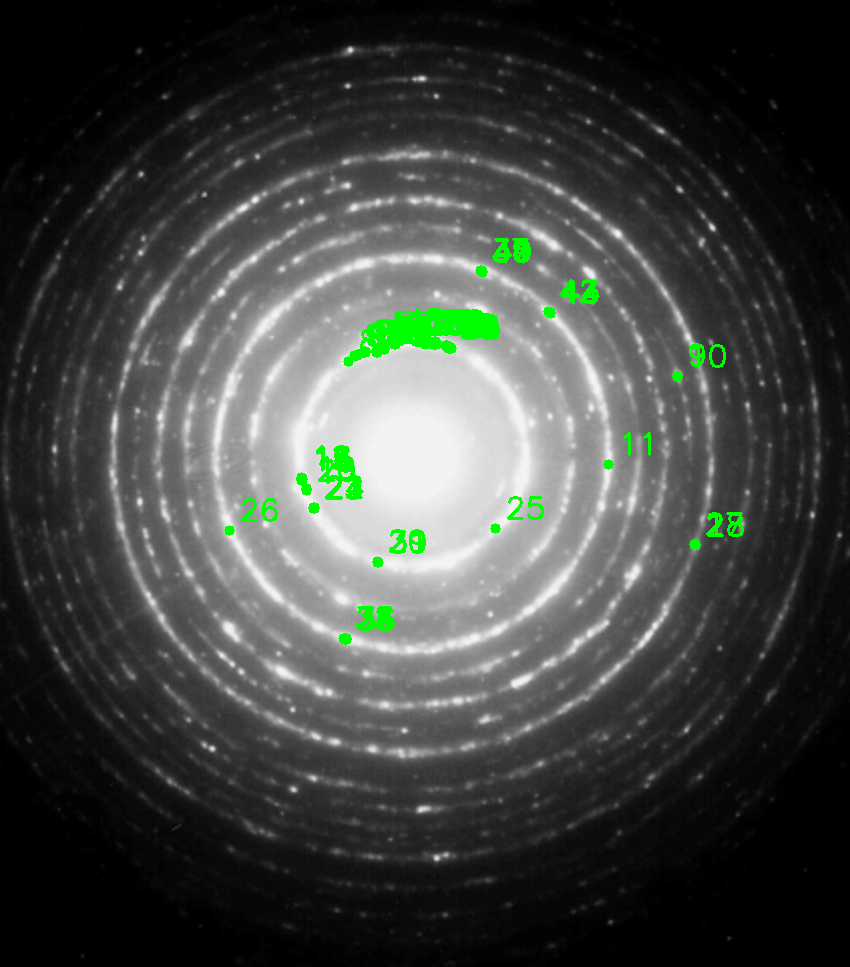

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import csv

# Load the image
image = cv2.imread('/content/BTP_Img_1.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Store intensity values from the original grayscale image
intensity_values = gray_image.copy()

# Find the coordinates of the top 10 points with the highest intensity
top_coords = []
for i in range(100):
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(gray_image)
    top_coords.append(max_loc)
    # Mark the point with a circle and label it
    cv2.circle(image, max_loc, 5, (0, 255, 0), -1)
    cv2.putText(image, f'{i+1}', (max_loc[0] + 10, max_loc[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
    # Set the intensity of the found maximum to zero
    gray_image[max_loc[1], max_loc[0]] = 0

# Save coordinates, labels, and intensity values to a CSV file
with open('top_coordinates_100.csv', 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Label', 'X', 'Y', 'Intensity'])
    for i, (x, y) in enumerate(top_coords, start=1):
        intensity = intensity_values[y, x]  # Intensity from the original grayscale image
        csvwriter.writerow([f'Brightest_{i}', x, y, intensity])

# Display the marked image
cv2_imshow(image)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


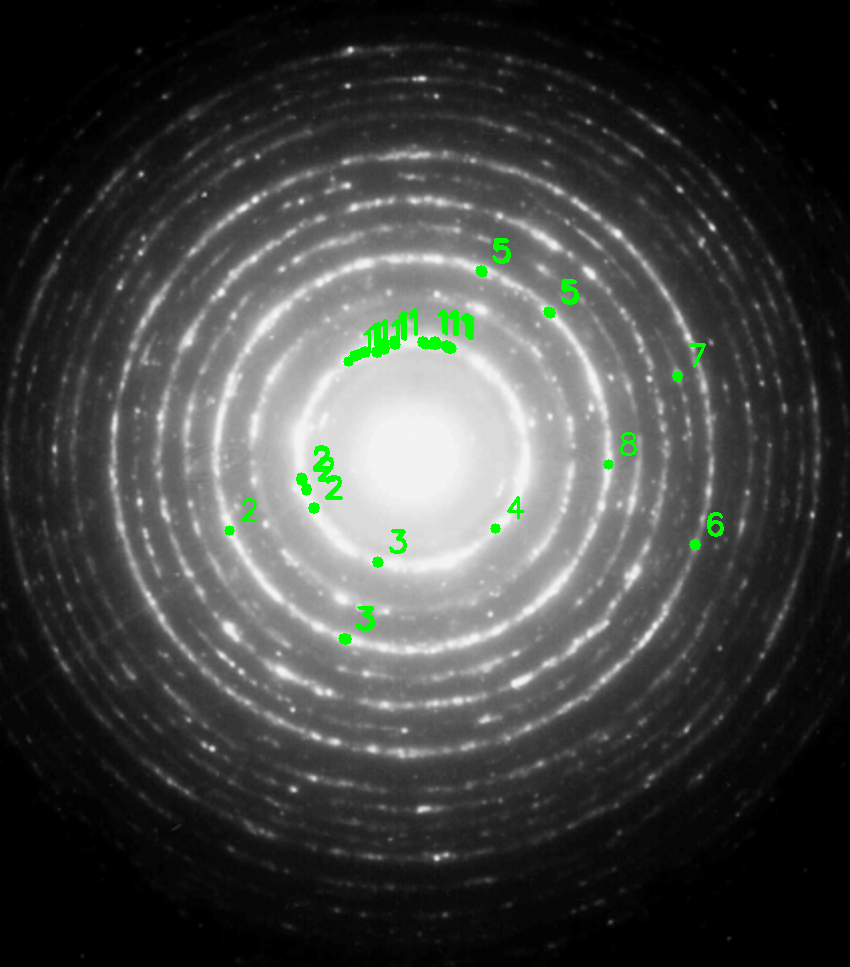

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import csv
import numpy as np
from scipy.spatial import distance
from sklearn.cluster import AgglomerativeClustering

# Load the image
image = cv2.imread('/content/BTP_Img_1.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Store intensity values from the original grayscale image
intensity_values = gray_image.copy()

# Find the coordinates of the top 100 points with the highest intensity
top_coords = []
for i in range(100):
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(gray_image)
    top_coords.append(max_loc)
    # Set the intensity of the found maximum to zero
    gray_image[max_loc[1], max_loc[0]] = 0

# Perform hierarchical clustering on the points to identify clusters based on proximity
# Here, n_clusters is the number of clusters to form and linkage specifies the linkage criterion to use
X = np.array(top_coords)
hierarchical_clustering = AgglomerativeClustering(n_clusters=8, linkage='complete', affinity='euclidean')
clusters = hierarchical_clustering.fit_predict(X)

# Group the points based on clusters
clustered_points = {}
for i, cluster_label in enumerate(clusters):
    if cluster_label not in clustered_points:
        clustered_points[cluster_label] = []
    clustered_points[cluster_label].append(top_coords[i])

# Save cluster information to a CSV file
with open('clusters.csv', 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Cluster', 'Label', 'X', 'Y', 'Intensity'])
    for cluster_label, cluster_points in clustered_points.items():
        for i, (x, y) in enumerate(cluster_points, start=1):
            intensity = intensity_values[y, x]  # Intensity from the original grayscale image
            csvwriter.writerow([f'C_{cluster_label+1}', f'Brightest_{i}', x, y, intensity])

# Draw circles for clustered points on the image
for cluster_label, cluster_points in clustered_points.items():
    for x, y in cluster_points:
        cv2.circle(image, (x, y), 5, (0, 255, 0), -1)
        cv2.putText(image, f'{cluster_label+1}', (x + 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

# Display the marked image
cv2_imshow(image)

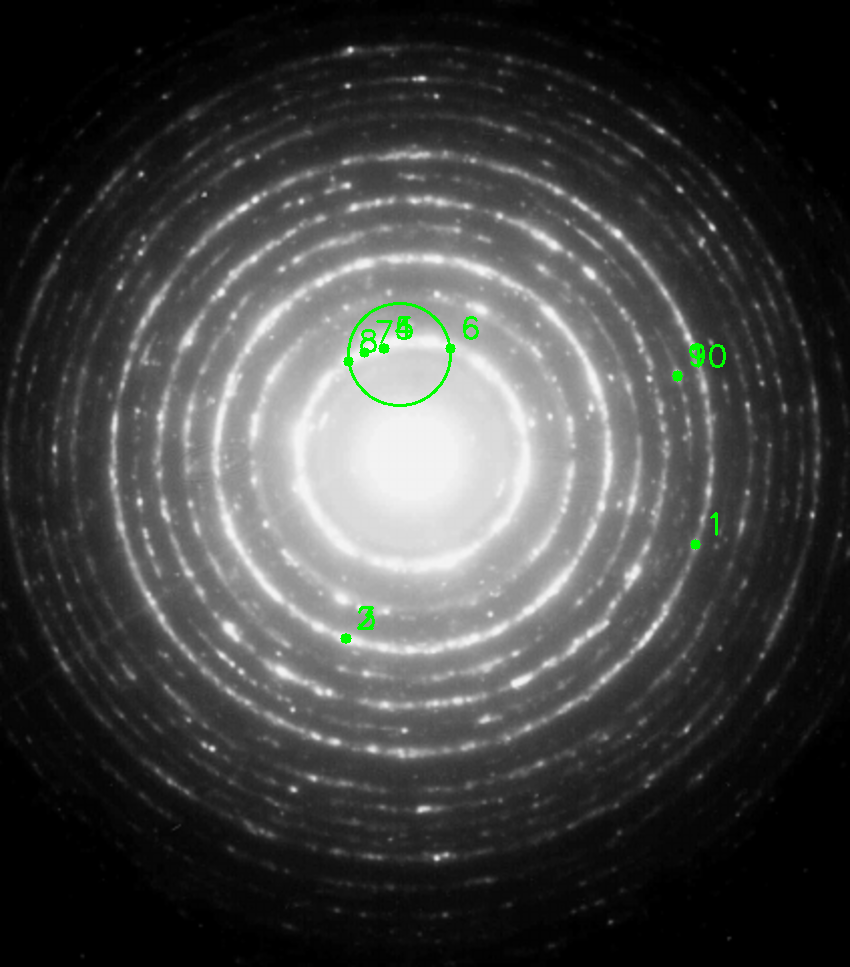

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/BTP_Intensity_1.png')

# Define the coordinates of the 5 points (assuming points are in (x, y) format)
points = [(383, 348), (450, 348), (364, 352), (348, 361)]

# Fit a circle passing through the points
(x, y), radius = cv2.minEnclosingCircle(np.array(points, dtype=np.float32))

# Convert center coordinates and radius to integers
center = (int(x), int(y))
radius = int(radius)

# Draw the circle on the image
cv2.circle(image, center, radius, (0, 255, 0), 2)

# Display the image with the circle drawn
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

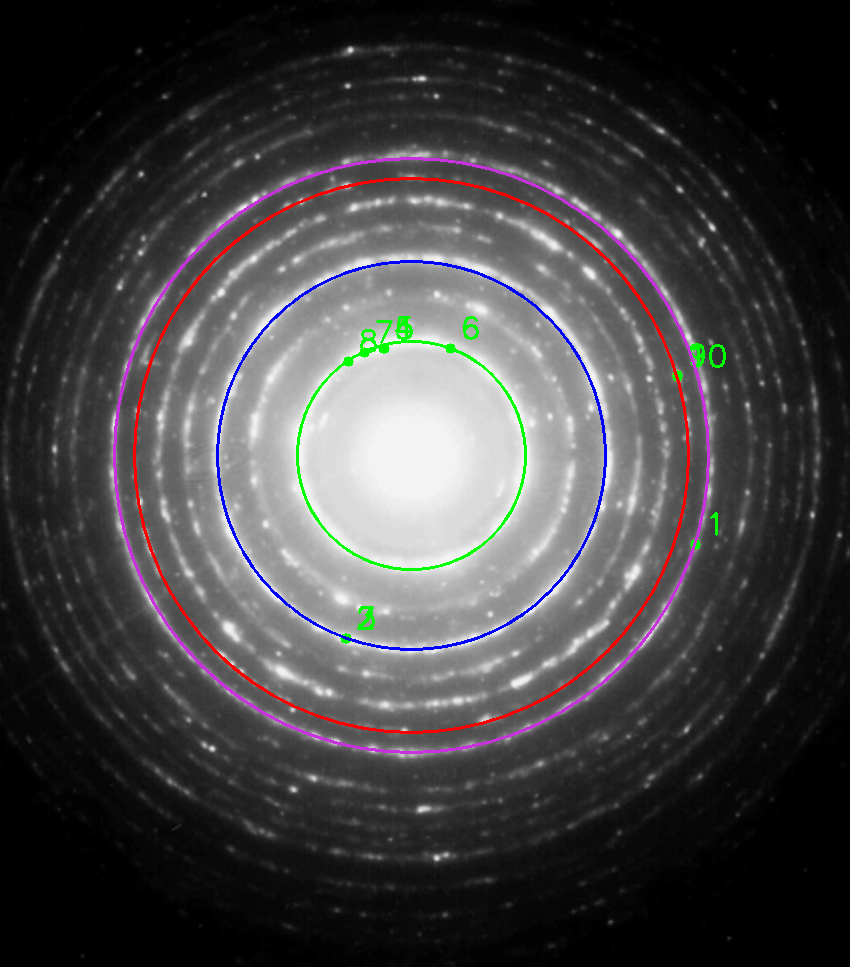

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

# Load the image
image = cv2.imread('/content/BTP_Intensity_1.png')

# Define the coordinates of the 5 points (assuming points are in (x, y) format)
points = [(450, 348), (364, 352), (348, 361)]

# Find the center and radius of the circle passing through the points
# Assuming all points lie on the circumference of the circle
# Using the algorithm for finding the center and radius of a circle given three points
def find_circle_center_radius(p1, p2, p3):
    x1, y1 = p1
    x2, y2 = p2
    x3, y3 = p3
    ma = (y2 - y1) / (x2 - x1)
    mb = (y3 - y2) / (x3 - x2)
    xc = (ma * mb * (y1 - y3) + mb * (x1 + x2) - ma * (x2 + x3)) / (2 * (mb - ma))
    yc = -1 / ma * (xc - (x1 + x2) / 2) + (y1 + y2) / 2
    radius = np.sqrt((x1 - xc) ** 2 + (y1 - yc) ** 2)
    return (int(xc), int(yc)), int(radius)

# Find the center and radius of the circle passing through the points
center, radius = find_circle_center_radius(points[0], points[1], points[2])

# Draw the circle on the image
cv2.circle(image, center, radius, (0, 255, 0), 2)

new_point = (346, 638)

# Calculate the radius for the new circle using the same center
new_radius = int(np.sqrt((new_point[0] - center[0]) ** 2 + (new_point[1] - center[1]) ** 2))

# Draw the new circle on the image
cv2.circle(image, center, new_radius, (255, 0, 0), 2)

new_point = (695, 544)

# Calculate the radius for the new circle using the same center
new_radius = int(np.sqrt((new_point[0] - center[0]) ** 2 + (new_point[1] - center[1]) ** 2))

# Draw the new circle on the image
cv2.circle(image, center, new_radius, (220, 50, 200), 2)

new_point = (677, 375)

# Calculate the radius for the new circle using the same center
new_radius = int(np.sqrt((new_point[0] - center[0]) ** 2 + (new_point[1] - center[1]) ** 2))

# Draw the new circle on the image
cv2.circle(image, center, new_radius, (0, 0, 255), 2)

# Display the image with both circles drawn
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
print(center)

(411, 455)


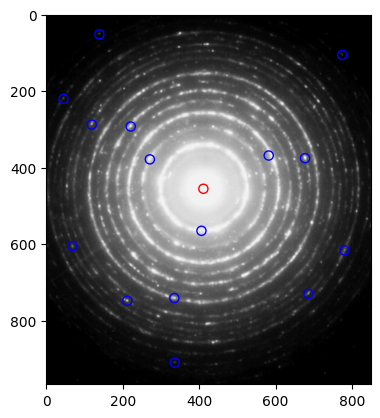

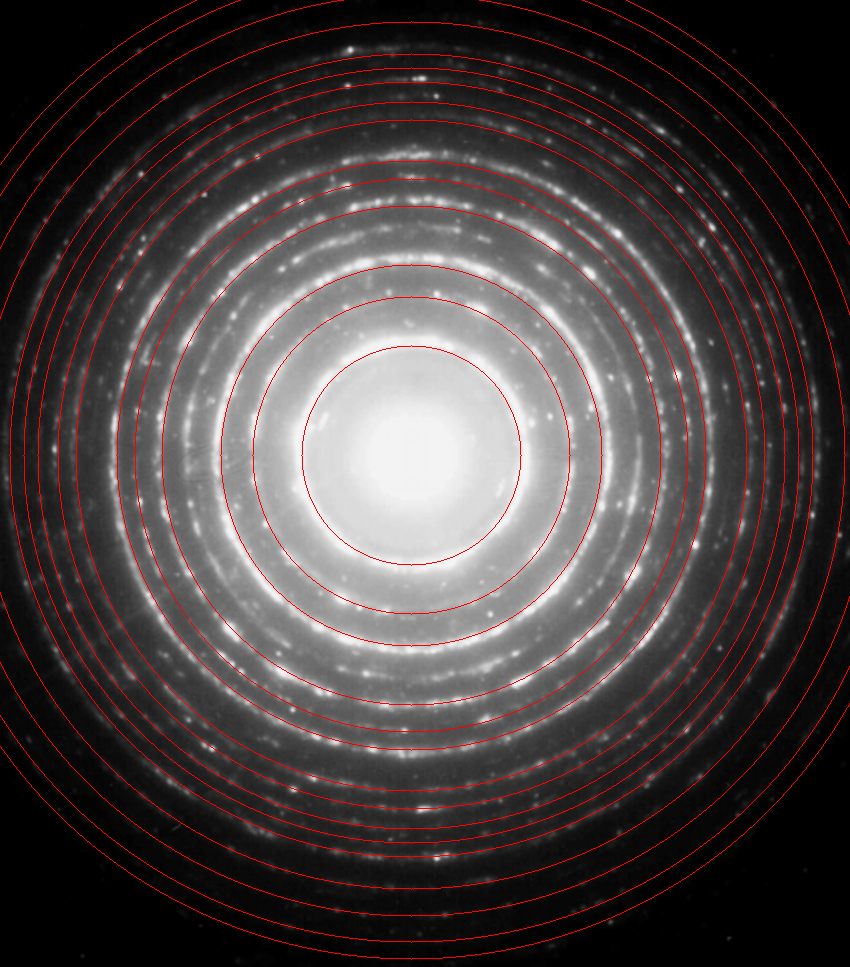

Number of circles drawn: 15


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the CSV file into a pandas DataFrame
data = pd.read_csv('/content/top_coordinates_50 (1).csv')

# Sort the DataFrame by the 'Distance_from_center' column
data = data.sort_values(by='Distance_from_center')

# Initialize variables to keep track of the previous distance
prev_distance = None

# Load the image
image = plt.imread('/content/BTP_Img_1.png')
image_2 = cv2.imread('/content/BTP_Img_1.png')
acc_circ_coords = []

# Plot the image
plt.imshow(image)

# Draw the central circle
center_x, center_y = 411, 455
center_circle = Circle((center_x, center_y), 12, color='red', fill=False)
plt.gca().add_patch(center_circle)

# Draw circles for each point in the DataFrame
circles_drawn = 0
for index, row in data.iterrows():
    distance = row['Distance_from_center']
    x, y = row['X'], row['Y']

    # Check if the distance is not within 12 units of the previous value
    if prev_distance is None or abs(distance - prev_distance) > 12:
        radius = np.sqrt((x - center_x)**2 + (y - center_y)**2)
        # Draw the circle with its circumference using a different color
        cv2.circle(image_2, (center_x, center_y), int(radius), (0, 0, 255), 1)
        circle = Circle((x, y), 12, color='blue', fill=False)
        plt.gca().add_patch(circle)
        circles_drawn += 1
        prev_distance = distance

# Show the plot
plt.show()

cv2_imshow(image_2)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Print the number of circles drawn
print("Number of circles drawn:", circles_drawn)

[110]
[160]
[192]
[250]
[278]
[296]
[337]
[354]
[374]
[389]
[403]
[435]
[461]
[487]
[504]


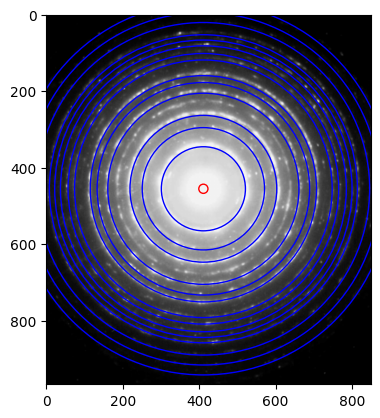

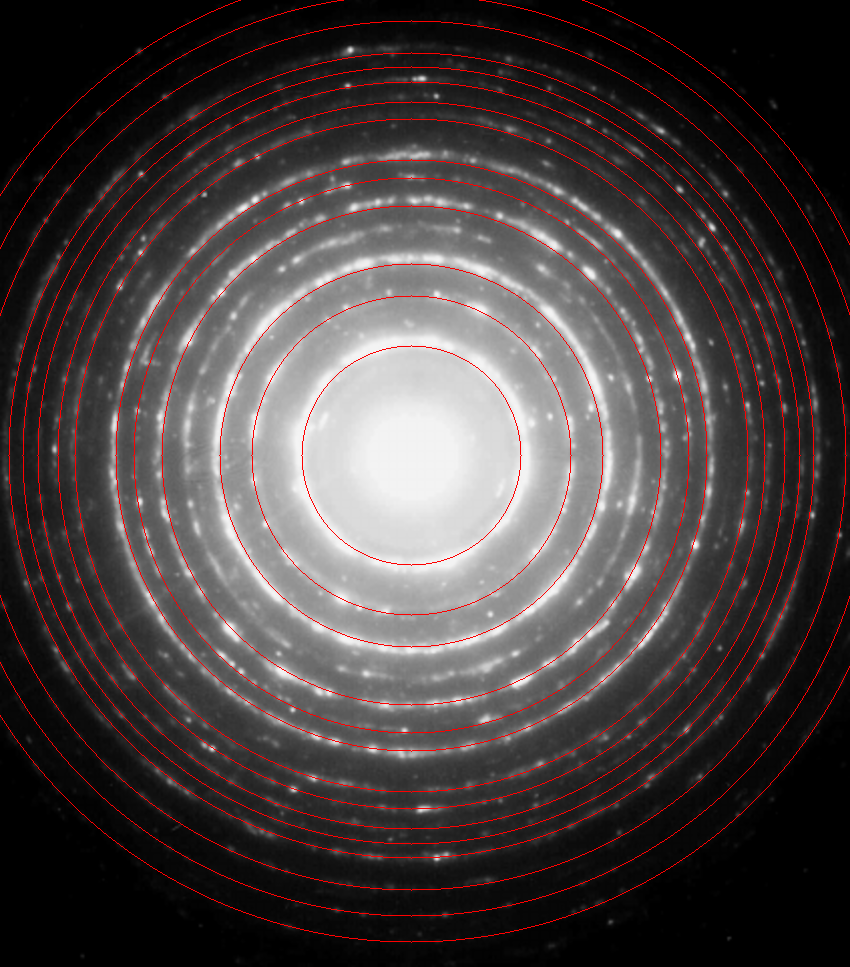

Number of circles drawn: 14


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the CSV file into a pandas DataFrame
data = pd.read_csv('/content/50_Highest_Intensity_Points.csv')

# Sort the DataFrame by the 'Distance_from_center' column
data = data.sort_values(by='Distance_from_center')

# Initialize variables to keep track of the previous distance and distances to be averaged
prev_distance = None
avg_distances = []

# Load the image
image = plt.imread('/content/BTP_Img_1.png')
image_2 = cv2.imread('/content/BTP_Img_1.png')
acc_circ_coords = []

# Plot the image
plt.imshow(image)

# Draw the central circle
center_x, center_y = 411, 455
center_circle = Circle((center_x, center_y), 12, color='red', fill=False)
plt.gca().add_patch(center_circle)

# Draw circles for each point in the DataFrame
circles_drawn = 0
for index, row in data.iterrows():
    distance = row['Distance_from_center']
    x, y = row['X'], row['Y']

    # Check if the distance is not within 12 units of the previous value
    if prev_distance is None or abs(distance - prev_distance) > 12:
        # Check if there are distances to be averaged
        if avg_distances:
            # Calculate the average distance
            avg_distance = sum(avg_distances) / len(avg_distances)
            # Draw the circle with its circumference using a different color
            cv2.circle(image_2, (center_x, center_y), int(avg_distance), (0, 0, 255), 1)
            circle = Circle((center_x, center_y), int(avg_distance), color='blue', fill=False)
            plt.gca().add_patch(circle)
            circles_drawn += 1
            # Clear the list of distances to be averaged
            avg_distances = []

        # Add the current distance to the list of distances to be averaged
        avg_distances.append(distance)
        print(avg_distances)
        prev_distance = distance

# Show the plot
plt.show()

cv2_imshow(image_2)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Print the number of circles drawn
print("Number of circles drawn:", circles_drawn)

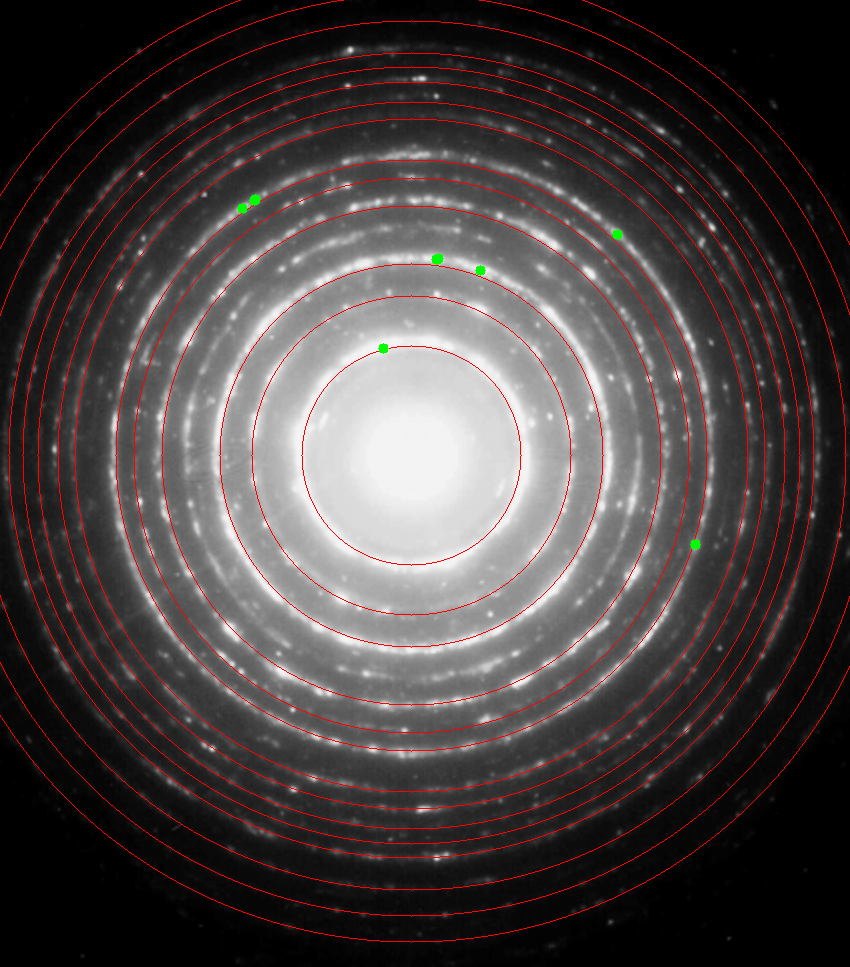

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the image
image = cv2.imread('/content/BTP_Img_1_Improved_Slightly.png')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find the intensity values of each pixel
intensity_values = gray_image.copy()

# Find the 10 most intense points
intense_points = []
for _ in range(10):
    max_intensity = np.max(gray_image)
    max_loc = np.where(gray_image == max_intensity)
    intense_points.append((max_loc[1][0], max_loc[0][0]))
    gray_image[max_loc] = 0  # Set the intensity to zero to avoid selecting the same point again

# Check if each identified point is not within 5 units from a circle
valid_points = []
center = (411, 455)  # Define the center of the circle
radius_threshold = 20  # Define the radius threshold

for point in intense_points:
    x, y = point
    distance_from_center = np.sqrt((x - 411)**2 + (y - 455)**2)
    if distance_from_center > radius_threshold:
        valid_points.append(point)

# Draw circles or markers on the original image for the identified valid points
for point in valid_points:
    x, y = point
    cv2.circle(image, (x, y), 5, (0, 255, 0), -1)

# Display the original image with the identified valid points marked
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import numpy as np

df = pd.read_csv("/content/top_coordinates_50 (3).csv")

intensity_values = df["Intensity"]
distances_from_center = df["Distance_from_center"]

corr_coefficient = np.corrcoef(intensity_values, distances_from_center)[0, 1]

print("Correlation Coefficient:", corr_coefficient)

# **Image 2 and 3**

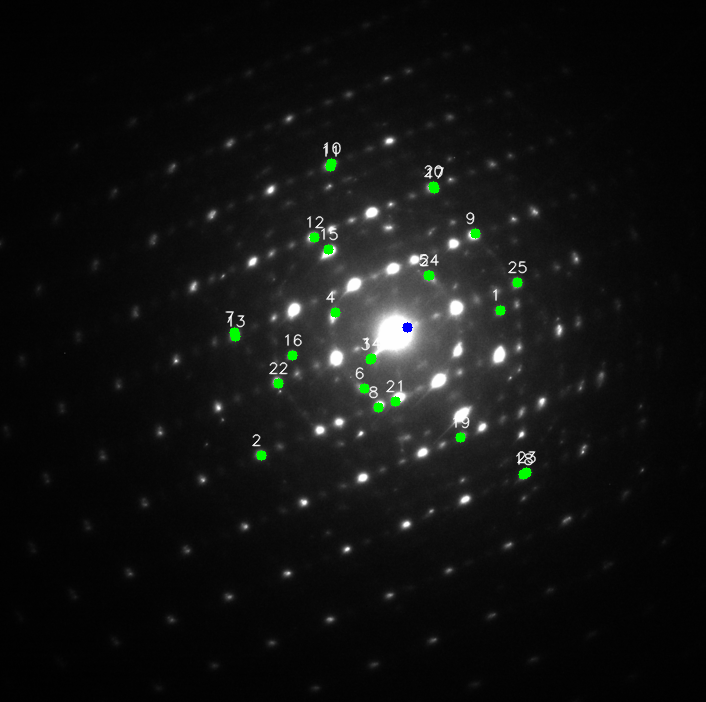

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import csv

def find_most_intense_points(image, num_points=10):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Flatten the 2D grayscale image into a 1D array
    flattened_image = gray_image.flatten()

    # Find indices of the top num_points intense pixels
    top_indices = np.argsort(flattened_image)[-num_points:]

    # Convert indices to 2D coordinates
    rows, cols = np.unravel_index(top_indices, gray_image.shape)

    # Return the coordinates of the top intense points
    intense_points = list(zip(cols, rows))
    return intense_points

# Load the image
image = cv2.imread('/content/BTP_Img_3_Cropped.png')

# Find the 10 most intense points
intense_points = find_most_intense_points(image, num_points=25)

# Draw circles around intense points on the original image and number them
font = cv2.FONT_HERSHEY_SIMPLEX
for i, point in enumerate(intense_points):
    cv2.circle(image, point, 5, (0, 255, 0), -1)  # Draw a filled circle of radius 5
    cv2.putText(image, str(i+1), (point[0] - 10, point[1] - 10), font, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

# Draw the center of the circle on the image
cv2.circle(image, center, 5, (255, 0, 0), -1)

# Save intense points to CSV file with numbers
with open('intense_points_Img3.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Number', 'X', 'Y'])  # Write header
    for i, point in enumerate(intense_points):
        writer.writerow([i+1, point[0], point[1]])

# Display the image with circles and numbers
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

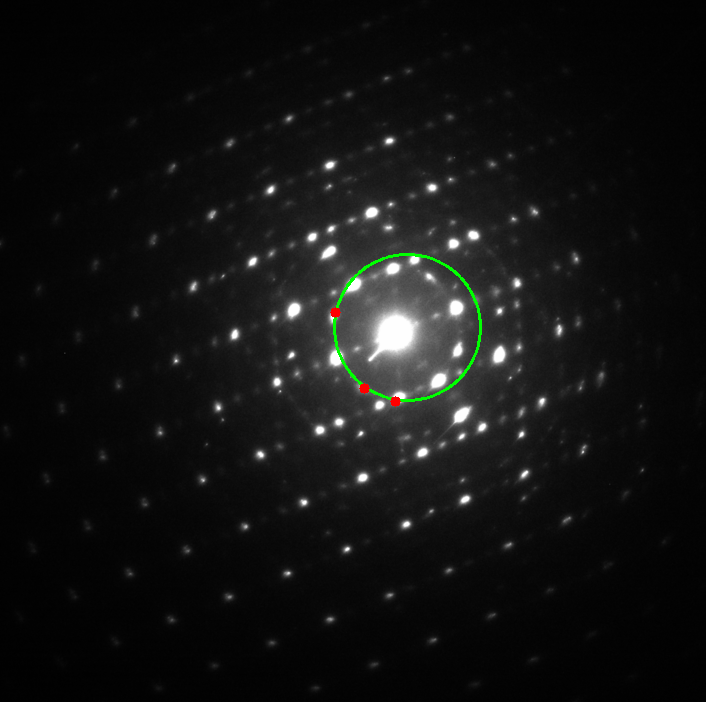

Center of the circle: (407, 327)


In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np

# Given points
points = [(335, 312), (364, 388), (395, 401)]

# Calculate the center of the circle passing through these points
x1, y1 = points[0]
x2, y2 = points[1]
x3, y3 = points[2]

# Using the formula for the center of a circle given three points
d = 2 * (x1 * (y2 - y3) + x2 * (y3 - y1) + x3 * (y1 - y2))
center_x = ((x1**2 + y1**2) * (y2 - y3) + (x2**2 + y2**2) * (y3 - y1) + (x3**2 + y3**2) * (y1 - y2)) / d
center_y = ((x1**2 + y1**2) * (x3 - x2) + (x2**2 + y2**2) * (x1 - x3) + (x3**2 + y3**2) * (x2 - x1)) / d

center = int(center_x), int(center_y)

# Calculate the radius of the circle
radius = int(np.sqrt((center[0] - x1)**2 + (center[1] - y1)**2))

# Load the image
image = cv2.imread('/content/BTP_Img_3_Cropped.png')

# Draw the circle passing through the given points on the input image
cv2.circle(image, center, radius, (0, 255, 0), 2)

# Draw the given points on the image
for point in points:
    cv2.circle(image, point, 5, (0, 0, 255), -1)

# Display the image with the circle and points
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Print the center of the circle
print("Center of the circle:", center)

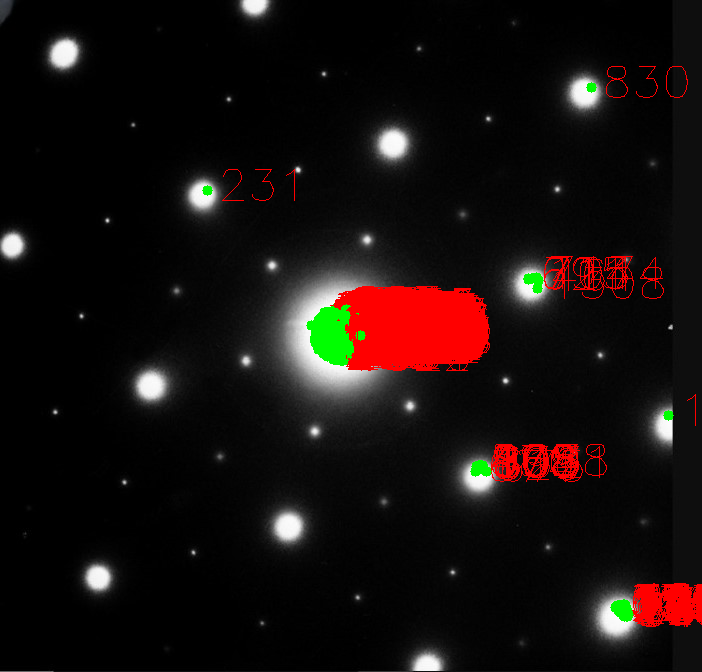

In [ ]:
import cv2
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow

def find_most_intense_points(image, num_points=10):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Flatten the 2D grayscale image into a 1D array
    flattened_image = gray_image.flatten()

    # Find indices of the top num_points intense pixels
    top_indices = np.argsort(flattened_image)[-num_points:]

    # Convert indices to 2D coordinates
    rows, cols = np.unravel_index(top_indices, gray_image.shape)

    # Get the intensity values of the top intense points
    intense_values = flattened_image[top_indices]

    # Return the coordinates and intensity values of the top intense points
    intense_points = list(zip(cols, rows, intense_values))
    return intense_points

# Load the image
image = cv2.imread('/content/BTP_Img_2__TextRemoved.jpg')

# Find the 10 most intense points
intense_points = find_most_intense_points(image, num_points=2000)

# Draw circles around intense points on the original image and add numbers
for i, (x, y, intensity) in enumerate(intense_points):
    cv2.circle(image, (x, y), 5, (0, 255, 0), -1)  # Draw a filled circle of radius 5
    cv2.putText(image, str(i + 1), (x + 10, y + 10), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (0, 0, 255), 1)

# Display the image with circles
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Create DataFrame with X, Y coordinates, Intensity, and Number
data = {'Number': [i + 1 for i in range(len(intense_points))],
        'X': [point[0] for point in intense_points],
        'Y': [point[1] for point in intense_points],
        'Intensity': [point[2] for point in intense_points]
        }

# Convert DataFrame to CSV
df = pd.DataFrame(data)
df.to_csv('Img3.csv', index=False)

(346, 324)
193


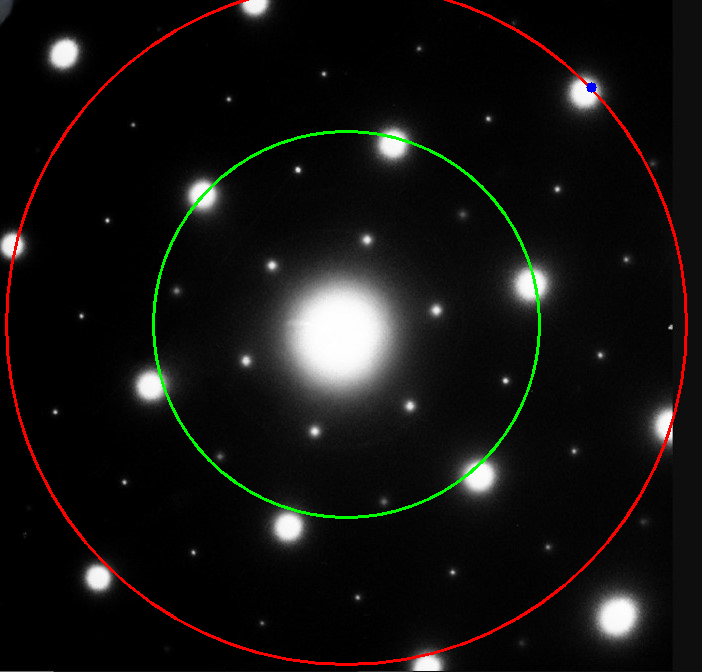

In [ ]:
import cv2
import numpy as np

# Given coordinates for the first circle
coordinates1 = [(535, 278), (480, 465), (207, 190)]

# New point for the second circle
new_point = (591, 87)

# Load the image
image = cv2.imread('/content/BTP_Img_2__TextRemoved.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate the center and radius of the first circle
(x1, y1), radius1 = cv2.minEnclosingCircle(np.array(coordinates1, dtype=np.float32))

# Convert center coordinates to integers
center = (int(x1), int(y1))
print(center)
# Convert radius to integer
radius1 = int(radius1)
print(radius1)
# Calculate the radius of the second circle
radius2 = np.sqrt((center[0] - new_point[0])**2 + (center[1] - new_point[1])**2)

# Draw the first circle on the image
cv2.circle(image, center, radius1, (0, 255, 0), 2)

# Draw the second circle on the image
cv2.circle(image, center, int(radius2), (0, 0, 255), 2)

# Draw the point
cv2.circle(image, new_point, 5, (255, 0, 0), -1)

# Display the image with both circles
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

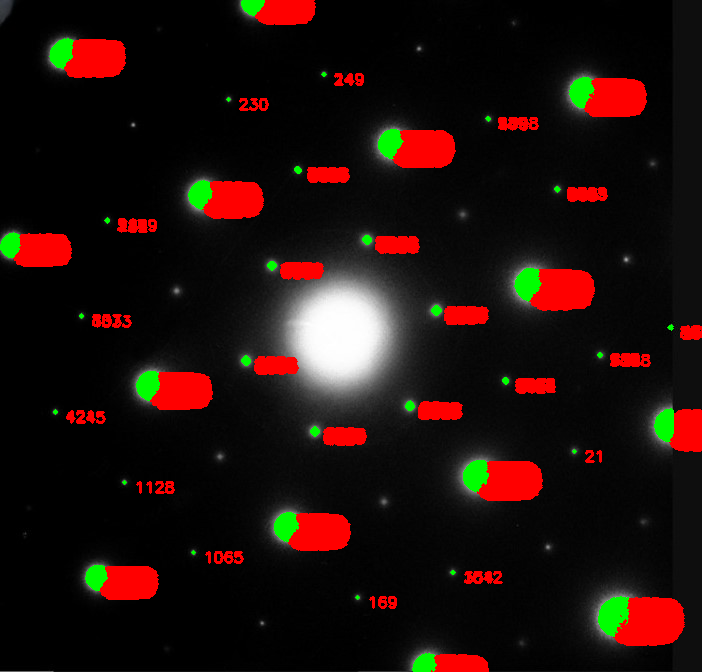

In [ ]:
import cv2
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow

def find_most_intense_points(image, center, min_distance=50, num_points=1000):
    # Calculate the distance from each pixel to the center
    distances = np.sqrt((np.arange(image.shape[0])[:,np.newaxis] - center[1])**2 +
                        (np.arange(image.shape[1])[np.newaxis,:] - center[0])**2)

    # Mask the pixels that are at least min_distance away from the center
    masked_image = np.where(distances >= min_distance, image, 0)

    # Flatten the masked image into a 1D array
    flattened_image = masked_image.flatten()

    # Find the indices of the top num_points intense pixels
    top_indices = np.argsort(flattened_image)[-num_points:]

    # Convert indices to 2D coordinates
    rows, cols = np.unravel_index(top_indices, masked_image.shape)

    # Return the coordinates of the top intense points
    intense_points = list(zip(cols, rows))
    return intense_points

# Load the image
image = cv2.imread('/content/BTP_Img_2__TextRemoved.jpg')

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Define the center point
center = (338, 333)

# Find the intense points at least 65 units away from the center
intense_points = find_most_intense_points(gray_image, center, min_distance=65, num_points=7500)

# Draw circles and number the intense points on the original image
for i, (x, y) in enumerate(intense_points):
    cv2.circle(image, (x, y), 2, (0, 255, 0), -1)  # Draw a filled circle of radius 2
    cv2.putText(image, str(i + 1), (x + 10, y + 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

# Display the image with intense points marked
cv2_imshow(image)

# Save the numbers, coordinates, intensity, and distance from center in a CSV file
distances_from_center = [np.sqrt((x - center[0])**2 + (y - center[1])**2) for x, y in intense_points]
data = {'Number': list(range(1, len(intense_points) + 1)),
        'X': [point[0] for point in intense_points],
        'Y': [point[1] for point in intense_points],
        'Intensity': [gray_image[y, x] for x, y in intense_points],
        'Distance_from_center': np.round(distances_from_center)}

df = pd.DataFrame(data)
df.to_csv('Img_3.csv', index=False)

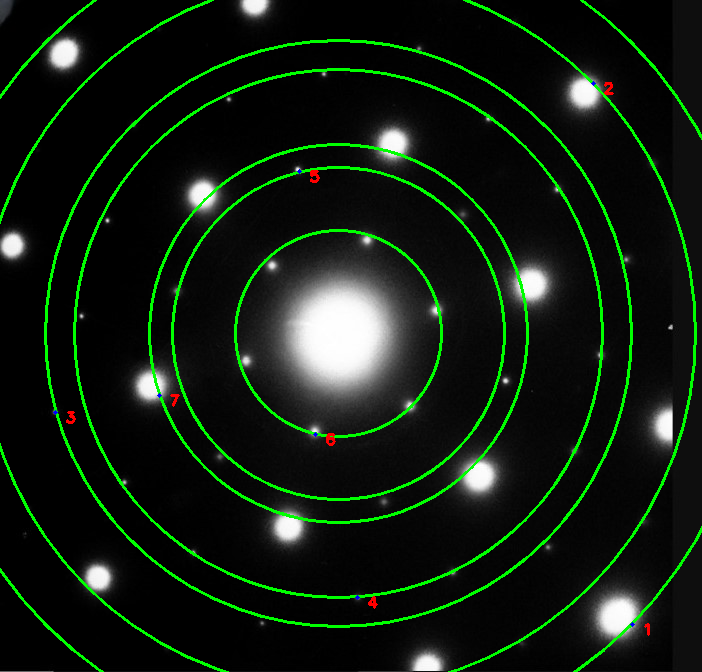

In [ ]:
import cv2
import numpy as np

# Given points
points = [(632, 624), (593, 83), (55, 412), (357, 597), (299, 171), (315, 434), (159,395)]

# Load the image
image = cv2.imread('/content/BTP_Img_2__TextRemoved.jpg')

# Define the center point
center = (338, 333)

# Draw circles with given points on the circumference
for i, (x, y) in enumerate(points):
    # Calculate the radius
    radius = np.sqrt((x - center[0])**2 + (y - center[1])**2)

    # Draw the circle
    cv2.circle(image, center, int(radius), (0, 255, 0), 2)

    # Mark the specified point
    cv2.circle(image, (x, y), 2, (255, 0, 0), -1)

    # Display the circle number
    cv2.putText(image, str(i+1), (x + 10, y + 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

# Display the image with circles and marked points
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
import pandas as pd

# Read the CSV file into a DataFrame
df = pd.read_csv('intense_points_data.csv')

# Sort the DataFrame based on distance from the center in descending order
df_sorted = df.sort_values(by='Distance_from_center', ascending=False)

# Save the sorted DataFrame back to the CSV file
df_sorted.to_csv('intense_points_data_sorted.csv', index=False)

In [ ]:
import pandas as pd

# Read the sorted CSV file into a DataFrame
df_sorted = pd.read_csv('intense_points_data_sorted.csv')

# Create an empty DataFrame to store the split data
split_data = pd.DataFrame(columns=df_sorted.columns)

# Iterate through the sorted DataFrame and split it based on the condition
for i in range(len(df_sorted) - 1):
    split_data = pd.concat([split_data, df_sorted.iloc[[i]]])
    # Check the difference in distance from the center between consecutive rows
    if abs(df_sorted.iloc[i]['Distance_from_center'] - df_sorted.iloc[i+1]['Distance_from_center']) > 5:
        # Insert an empty row
        empty_row = pd.Series([None] * len(split_data.columns), index=split_data.columns)
        split_data = pd.concat([split_data, empty_row.to_frame().T])

# Append the last row of the sorted DataFrame to the split data
split_data = pd.concat([split_data, df_sorted.iloc[[-1]]])

# Reset index
split_data.reset_index(drop=True, inplace=True)

# Save the split data to a new CSV file
split_data.to_csv('intense_points_data_split.csv', index=False)

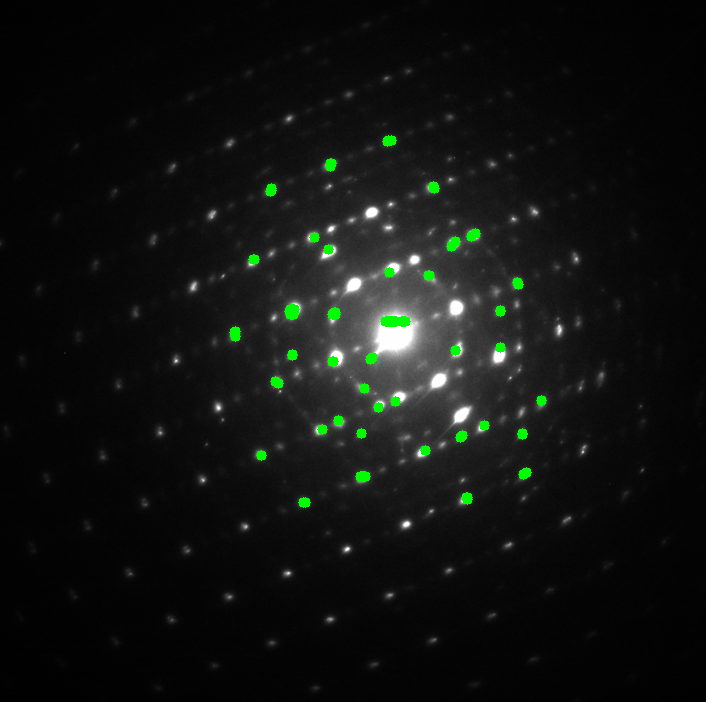

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def find_most_intense_points(image, num_points=10):
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Flatten the 2D grayscale image into a 1D array
    flattened_image = gray_image.flatten()

    # Find indices of the top num_points intense pixels
    top_indices = np.argsort(flattened_image)[-num_points:]

    # Convert indices to 2D coordinates
    rows, cols = np.unravel_index(top_indices, gray_image.shape)

    # Return the coordinates of the top intense points
    intense_points = list(zip(cols, rows))
    return intense_points

# Load the image
image = cv2.imread('/content/BTP_Img_3_Cropped.png')

# Find the 10 most intense points
intense_points = find_most_intense_points(image, num_points = 100)

# Draw circles around intense points on the original image
for point in intense_points:
    cv2.circle(image, point, 5, (0, 255, 0), -1)  # Draw a filled circle of radius 5

# Display the image with circles
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()

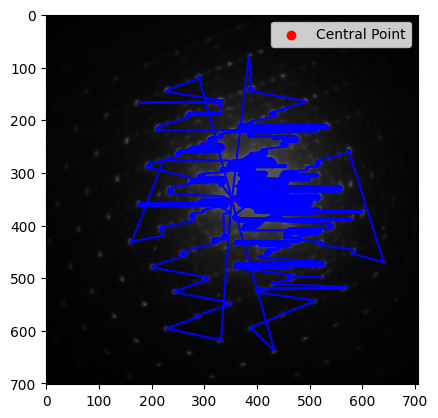

In [ ]:
import numpy as np
import cv2
from collections import defaultdict
import matplotlib.pyplot as plt
from scipy.spatial import distance

def find_central_point(image):
    # Calculate the centroid of the points with intensity above a threshold
    y, x = np.where(image > 0)  # Get coordinates of non-zero intensity points
    centroid_x = int(np.mean(x))
    centroid_y = int(np.mean(y))
    return centroid_x, centroid_y

def find_hexagon_points(image, central_point, threshold):
    hexagon_points = defaultdict(list)

    # Define the hexagon pattern
    hexagon_pattern = [(1, 0), (0.5, np.sqrt(3)/2), (-0.5, np.sqrt(3)/2),
                       (-1, 0), (-0.5, -np.sqrt(3)/2), (0.5, -np.sqrt(3)/2)]

    # Iterate through all points and check if they belong to a hexagon
    for y in range(image.shape[0]):
        for x in range(image.shape[1]):
            if image[y, x] > threshold:
                # Calculate distance from central point
                dist_to_central = distance.euclidean((x, y), central_point)
                # Find the nearest hexagon point
                min_dist_index = np.argmin([distance.euclidean((x+dx, y+dy), central_point) for dx, dy in hexagon_pattern])
                nearest_hexagon_point = (x + hexagon_pattern[min_dist_index][0], y + hexagon_pattern[min_dist_index][1])
                hexagon_points[min_dist_index].append(nearest_hexagon_point)

    return hexagon_points

def plot_hexagons(image, central_point, hexagon_points):
    plt.imshow(image, cmap='gray')
    plt.scatter(central_point[0], central_point[1], color='red', label='Central Point')

    for points in hexagon_points.values():
        points.append(points[0])  # Close the loop
        xs, ys = zip(*points)
        plt.plot(xs, ys, color='blue')

    plt.legend()
    plt.show()

def main():
    # Load the image (replace 'image_path' with the path to your image)
    image_path = '/content/BTP_Img_3_Cropped.png'
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Find the central point
    central_point = find_central_point(image)

    # Set the threshold to identify points of interest
    threshold = 100

    # Find points corresponding to hexagons
    hexagon_points = find_hexagon_points(image, central_point, threshold)

    # Plot hexagons
    plot_hexagons(image, central_point, hexagon_points)

if __name__ == "__main__":
    main()

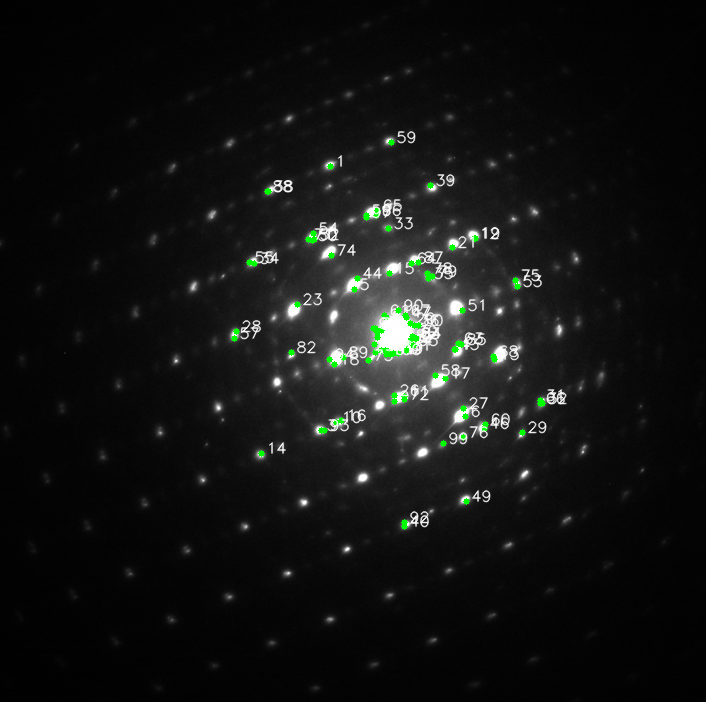

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Read the image
image = cv2.imread('/content/BTP_Img_3_Cropped.png')

# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Calculate intensity of each pixel
intensity = gray_image.astype(np.int32)

# Flatten the intensity array and sort it
flattened_intensity = intensity.flatten()
sorted_intensity_indices = np.argsort(flattened_intensity)[::-1]

# Find top 20 most intense points with different intensity values
top_20_points = []
intensity_values = set()
for index in sorted_intensity_indices:
    y, x = divmod(index, intensity.shape[1])
    intensity_value = flattened_intensity[index]
    if intensity_value not in intensity_values:
        top_20_points.append((x, y, intensity_value))
        intensity_values.add(intensity_value)
    if len(top_20_points) >= 100:
        break

# Display the intense points
font = cv2.FONT_HERSHEY_SIMPLEX
for i, point in enumerate(top_20_points):
    x, y, _ = point
    cv2.circle(image, (x, y), 3, (0, 255, 0), -1)
    cv2.putText(image, str(i+1), (x+5, y), font, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

# Display or save the result
cv2_imshow(image)
cv2.waitKey(0)
cv2.destroyAllWindows()